In [231]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [80]:
fog_train = pd.read_csv('/Users/yunkihun/weather-contest/weather-contest/fog_python/fog_train.csv')
fog_test = pd.read_csv('/Users/yunkihun/weather-contest/weather-contest/fog_python/fog_test.csv')

In [81]:
df = fog_train.drop("Unnamed: 0", axis=1)
df = df.replace(-99.00, np.NaN)
df = df.replace(-99.90, np.NaN)
df = df.dropna()

columns = df.columns
columns = [column.replace('fog_train.', "") for column in columns]
df.columns = columns

def stn_transform(value):
    if value.startswith("A"):
        return 1
    elif value.startswith("B"):
        return 2
    elif value.startswith("C"):
        return 3
    elif value.startswith("D"):
        return 4
    elif value.startswith("E"):
        return 5
    
df["stn_id"] = df["stn_id"].apply(stn_transform)
df["temp_diff"] = df["ta"] - df["ts"]
df['vis1_log'] = np.log1p(df['vis1'])

In [82]:
def is_fog(df, column):
    df["is_fog"] = df[column].apply(lambda x: 0 if x > 3 else 1)
    return df

df = is_fog(df, "class")

In [83]:
# 이슬점
def calculate_dew_point(T, RH):
    a = 17.27
    b = 237.7
    gamma = (a * T) / (b + T) + np.log(RH / 100.0)
    dew_point = (b * gamma) / (a - gamma)
    return dew_point

df['dew_point'] = calculate_dew_point(df['ta'], df['hm'])

dew_re_list = []
for i in range(len(df)):
    if df['ts'].values[i] < df['dew_point'].values[i]:
        dew_re_list.append(1)
    else:
        dew_re_list.append(0)
df['dew_reached'] = dew_re_list
df = df.drop(columns=['dew_point'])
df.shape

/Users/yunkihun/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


(2994850, 19)

In [138]:
# vis1_log 변수에 따라 class 집어넣는 함수
def class_add(x):
    if x < np.log1p(200):
        return 1
    elif x < np.log1p(500):
        return 2
    elif x < np.log1p(1000):
        return 3
    elif x >= 1:
        return 4

In [73]:
# CM 함수
def csi_index(cm):

     H = (cm[0][0] + cm[1][1] + cm[2][2])
     F = (cm[0][1] + cm[0][2] + 
          cm[1][0] + cm[1][2] + 
          cm[2][0] + cm[2][1] +
          cm[3][0] + cm[3][1] + cm[3][2])
     M = (cm[0][3] + cm[1][3] + cm[2][3])

     knn_csi = H / (H + F + M)
     return knn_csi

In [142]:
# feature importances 함수
def feature_importances(model, df):
    importances = model.feature_importances_
    feature_columns = list(df.columns.difference(["class"]))
    column_nm = pd.DataFrame(feature_columns)
    feature_importances = pd.concat([column_nm, pd.DataFrame(importances)], axis=1)
    feature_importances.columns=['feature_nm', 'importances']
    print(feature_importances)

In [204]:
df_fog = df[df['is_fog'] == 1]
df_fog['vis1_log'] = np.log1p(df_fog['vis1'])

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_42467/419053335.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fog['vis1_log'] = np.log1p(df_fog['vis1'])


<Axes: xlabel='hm', ylabel='vis1'>

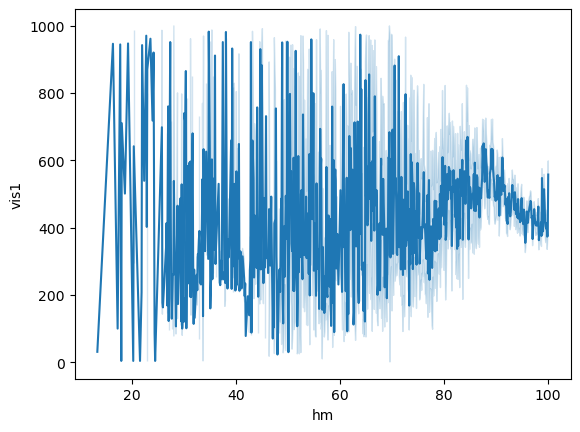

In [59]:
sns.lineplot(x='hm', y='vis1', data=df_fog)

<Axes: xlabel='hm', ylabel='ta'>

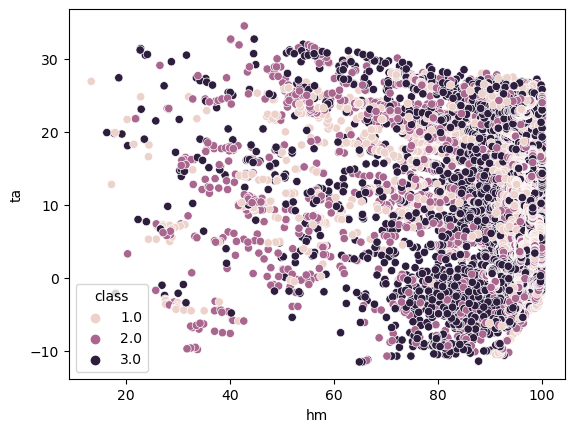

In [45]:
sns.scatterplot(x='hm', y='ta', hue='class', data=df_fog)

In [60]:
# 로그 변환 시켜보자
df_fog["vis1_log"] = np.log1p(df_fog['vis1'])

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_42467/2804673471.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fog["vis1_log"] = np.log1p(df_fog['vis1'])


<Axes: xlabel='hm', ylabel='vis1_log'>

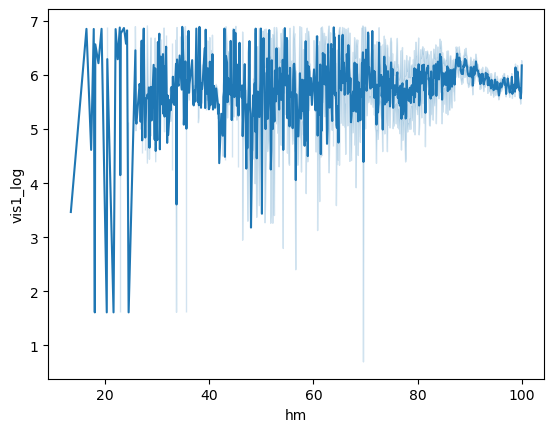

In [49]:
sns.lineplot(x='hm', y='vis1_log', data=df_fog)

<Axes: xlabel='sun10', ylabel='vis1_log'>

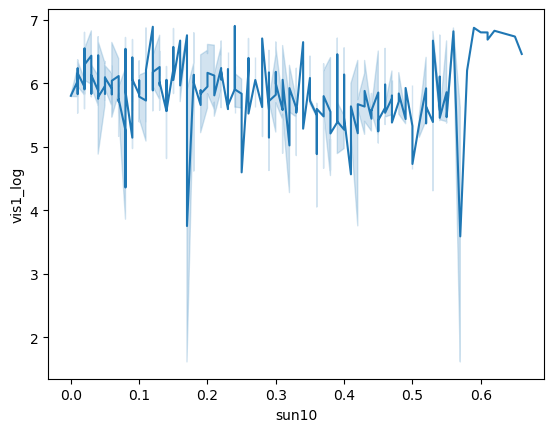

In [52]:
sns.lineplot(x='sun10', y='vis1_log', data=df_fog)

/Users/yunkihun/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


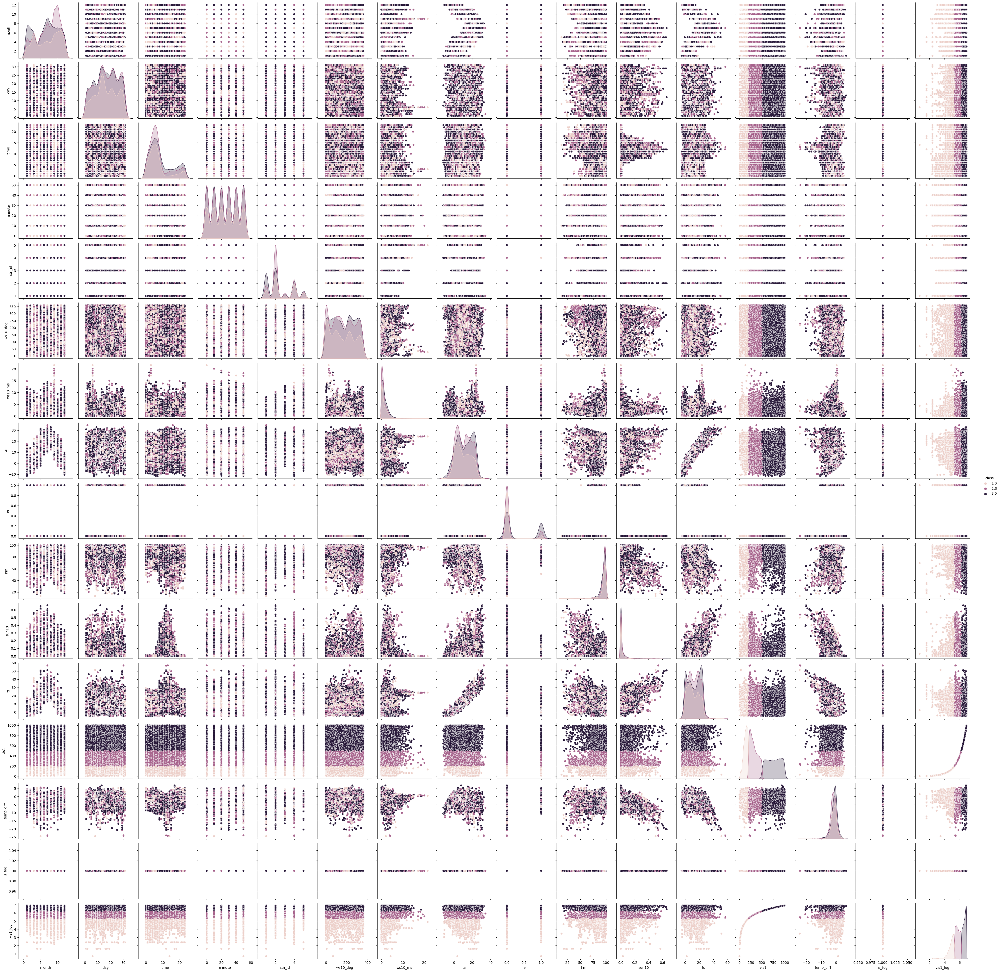

In [62]:
sns.pairplot(data=df_fog, hue='class')

In [85]:
# ws10_ms, ta, hm, sun10, ts, temp_diff가 그나마 뭔가 차이가 조금 있어 보인다.
# 따라서 이 변수들만 써서 decition tree를 돌려보자

temp = df.drop(columns=['year', 'month', 'day', 'time','minute', 'stn_id','ws10_deg','re','vis1', 'class','is_fog', 'dew_reached'])
temp

,ws10_ms,ta,hm,sun10,ts,temp_diff,vis1_log
0,0.0,-6.4,38.9,0.0,-2.8,-3.6,9.903538
1,0.0,-6.3,37.9,0.0,-2.7,-3.6,9.903538
2,0.0,-6.3,40.0,0.0,-2.6,-3.7,9.903538
3,0.4,-6.2,39.5,0.0,-2.6,-3.6,9.903538
4,0.5,-6.1,39.8,0.0,-2.5,-3.6,9.903538
...,...,...,...,...,...,...,...
3156454,7.7,2.5,50.2,0.0,-0.9,3.4,9.903538
3156455,5.7,2.3,50.1,0.0,-1.3,3.6,9.903538
3156456,4.9,2.2,51.0,0.0,-1.4,3.6,9.903538
3156457,4.6,2.1,51.7,0.0,-1.6,3.7,9.903538


In [152]:
def decision(df):
    feature_columns = df.columns.difference(['vis1_log'])
    x = df[feature_columns]
    y = df['vis1_log']

    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.25, random_state=42)

    rf_model = DecisionTreeRegressor(random_state=42)

    rf_model.fit(x_train, y_train)

    y_pred = rf_model.predict(x_test)
    
    y_pred = np.array(list(map(class_add, y_pred)))
    y_test = y_test.apply(class_add)

    cm = confusion_matrix(y_test, y_pred)

    print(cm)
    print(csi_index(cm))

    #feature_importances(rf_model,df)

In [146]:
# 기본 모델 (ws10_ms, ta, hm, sun10, ts, temp_diff // vis1_log)
decision(df)

[[   659    233     56    973]
 [   259    847    312   1586]
 [    65    301    462   2196]
 [  1272   1954   2463 735075]]
0.14430268367795865


In [153]:
# 이번엔 변수에 temp_diff를 빼고 해보자
df1 = df.drop(columns=['year', 'month', 'day', 'time','minute', 'stn_id','ws10_deg','re','vis1', 'class','is_fog', 'dew_reached', 'temp_diff'])
df1

,ws10_ms,ta,hm,sun10,ts,vis1_log
0,0.0,-6.4,38.9,0.0,-2.8,9.903538
1,0.0,-6.3,37.9,0.0,-2.7,9.903538
2,0.0,-6.3,40.0,0.0,-2.6,9.903538
3,0.4,-6.2,39.5,0.0,-2.6,9.903538
4,0.5,-6.1,39.8,0.0,-2.5,9.903538
...,...,...,...,...,...,...
3156454,7.7,2.5,50.2,0.0,-0.9,9.903538
3156455,5.7,2.3,50.1,0.0,-1.3,9.903538
3156456,4.9,2.2,51.0,0.0,-1.4,9.903538
3156457,4.6,2.1,51.7,0.0,-1.6,9.903538


In [154]:
decision(df1)

[[   612    246     64    999]
 [   273    834    292   1605]
 [    70    277    485   2192]
 [  1309   2014   2548 734893]]
0.13972503617945006


In [155]:
# temp_diff를 되살리고, month와 time을 넣고 해보자
df2 = df.drop(columns=['year', 'day','minute', 'stn_id','ws10_deg','re','vis1', 'class','is_fog', 'dew_reached'])
df2

,month,time,ws10_ms,ta,hm,sun10,ts,temp_diff,vis1_log
0,1,0,0.0,-6.4,38.9,0.0,-2.8,-3.6,9.903538
1,1,0,0.0,-6.3,37.9,0.0,-2.7,-3.6,9.903538
2,1,0,0.0,-6.3,40.0,0.0,-2.6,-3.7,9.903538
3,1,0,0.4,-6.2,39.5,0.0,-2.6,-3.6,9.903538
4,1,0,0.5,-6.1,39.8,0.0,-2.5,-3.6,9.903538
...,...,...,...,...,...,...,...,...,...
3156454,12,23,7.7,2.5,50.2,0.0,-0.9,3.4,9.903538
3156455,12,23,5.7,2.3,50.1,0.0,-1.3,3.6,9.903538
3156456,12,23,4.9,2.2,51.0,0.0,-1.4,3.6,9.903538
3156457,12,23,4.6,2.1,51.7,0.0,-1.6,3.7,9.903538


In [156]:
decision(df2)

[[   923    298     78    622]
 [   330   1085    382   1207]
 [    65    352    683   1924]
 [   776   1464   2205 736319]]
0.21712118767145394


In [162]:
# dew_reached를 넣어보자
df3 = df.drop(columns=['year', 'day','minute', 'stn_id','ws10_deg','re','vis1', 'class','is_fog'])
df3

,month,time,ws10_ms,ta,hm,sun10,ts,temp_diff,vis1_log,dew_reached
0,1,0,0.0,-6.4,38.9,0.0,-2.8,-3.6,9.903538,0
1,1,0,0.0,-6.3,37.9,0.0,-2.7,-3.6,9.903538,0
2,1,0,0.0,-6.3,40.0,0.0,-2.6,-3.7,9.903538,0
3,1,0,0.4,-6.2,39.5,0.0,-2.6,-3.6,9.903538,0
4,1,0,0.5,-6.1,39.8,0.0,-2.5,-3.6,9.903538,0
...,...,...,...,...,...,...,...,...,...,...
3156454,12,23,7.7,2.5,50.2,0.0,-0.9,3.4,9.903538,0
3156455,12,23,5.7,2.3,50.1,0.0,-1.3,3.6,9.903538,0
3156456,12,23,4.9,2.2,51.0,0.0,-1.4,3.6,9.903538,0
3156457,12,23,4.6,2.1,51.7,0.0,-1.6,3.7,9.903538,0


In [163]:
decision(df3)
# 오히려 떨어진다. dew_reached는 빼보자

[[   911    302     79    629]
 [   327   1078    424   1175]
 [    70    352    694   1908]
 [   786   1477   2185 736316]]
0.21642332822457047


In [164]:
# 풍향 추가
df4 = df.drop(columns=['year', 'day','minute', 'stn_id','re','vis1', 'class','is_fog', 'dew_reached'])
df4

,month,time,ws10_deg,ws10_ms,ta,hm,sun10,ts,temp_diff,vis1_log
0,1,0,0.0,0.0,-6.4,38.9,0.0,-2.8,-3.6,9.903538
1,1,0,0.0,0.0,-6.3,37.9,0.0,-2.7,-3.6,9.903538
2,1,0,0.0,0.0,-6.3,40.0,0.0,-2.6,-3.7,9.903538
3,1,0,27.8,0.4,-6.2,39.5,0.0,-2.6,-3.6,9.903538
4,1,0,59.7,0.5,-6.1,39.8,0.0,-2.5,-3.6,9.903538
...,...,...,...,...,...,...,...,...,...,...
3156454,12,23,305.3,7.7,2.5,50.2,0.0,-0.9,3.4,9.903538
3156455,12,23,293.8,5.7,2.3,50.1,0.0,-1.3,3.6,9.903538
3156456,12,23,274.2,4.9,2.2,51.0,0.0,-1.4,3.6,9.903538
3156457,12,23,270.3,4.6,2.1,51.7,0.0,-1.6,3.7,9.903538


In [165]:
decision(df4)
# 풍향은 오히려 더 낮아진다. 빼고 다른 변수를 추가하자

[[   884    315     64    658]
 [   340   1046    358   1260]
 [    76    352    674   1922]
 [   685   1486   2100 736493]]
0.21309328968903438


In [166]:
# stn_id를 넣어보자
df5 = df.drop(columns=['year', 'day','minute', 'ws10_deg','re','vis1', 'class','is_fog', 'dew_reached'])
df5

,month,time,stn_id,ws10_ms,ta,hm,sun10,ts,temp_diff,vis1_log
0,1,0,1,0.0,-6.4,38.9,0.0,-2.8,-3.6,9.903538
1,1,0,1,0.0,-6.3,37.9,0.0,-2.7,-3.6,9.903538
2,1,0,1,0.0,-6.3,40.0,0.0,-2.6,-3.7,9.903538
3,1,0,1,0.4,-6.2,39.5,0.0,-2.6,-3.6,9.903538
4,1,0,1,0.5,-6.1,39.8,0.0,-2.5,-3.6,9.903538
...,...,...,...,...,...,...,...,...,...,...
3156454,12,23,5,7.7,2.5,50.2,0.0,-0.9,3.4,9.903538
3156455,12,23,5,5.7,2.3,50.1,0.0,-1.3,3.6,9.903538
3156456,12,23,5,4.9,2.2,51.0,0.0,-1.4,3.6,9.903538
3156457,12,23,5,4.6,2.1,51.7,0.0,-1.6,3.7,9.903538


In [167]:
decision(df5)
# stn_id는 넣는 걸로

[[   979    347     80    515]
 [   356   1197    416   1035]
 [    69    410    748   1797]
 [   610   1220   1942 736992]]
0.24946676904700965


In [184]:
#stn_id를 원핫 인코딩해서 넣어보자
df5_temp = pd.get_dummies(df5['stn_id'])
df6 = pd.concat([df5,df5_temp], axis=1)
df6 = df6.drop('stn_id', axis=1)
df6[1] = df6[1].astype(int)
df6[2] = df6[2].astype(int)
df6[3] = df6[3].astype(int)
df6[4] = df6[4].astype(int)
df6[5] = df6[5].astype(int)
df6 = df6.rename(columns={1: 'stn_A', 2: 'stn_B', 3: 'stn_C', 4: 'stn_D', 5: 'stn_E'})

In [185]:
df6

,month,time,ws10_ms,ta,hm,sun10,ts,temp_diff,vis1_log,stn_A,stn_B,stn_C,stn_D,stn_E
0,1,0,0.0,-6.4,38.9,0.0,-2.8,-3.6,9.903538,1,0,0,0,0
1,1,0,0.0,-6.3,37.9,0.0,-2.7,-3.6,9.903538,1,0,0,0,0
2,1,0,0.0,-6.3,40.0,0.0,-2.6,-3.7,9.903538,1,0,0,0,0
3,1,0,0.4,-6.2,39.5,0.0,-2.6,-3.6,9.903538,1,0,0,0,0
4,1,0,0.5,-6.1,39.8,0.0,-2.5,-3.6,9.903538,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3156454,12,23,7.7,2.5,50.2,0.0,-0.9,3.4,9.903538,0,0,0,0,1
3156455,12,23,5.7,2.3,50.1,0.0,-1.3,3.6,9.903538,0,0,0,0,1
3156456,12,23,4.9,2.2,51.0,0.0,-1.4,3.6,9.903538,0,0,0,0,1
3156457,12,23,4.6,2.1,51.7,0.0,-1.6,3.7,9.903538,0,0,0,0,1


In [186]:
decision(df6)
# 원핫 인코딩이 미세하게 올라서 애매함

[[  1015    330     86    490]
 [   380   1214    419    991]
 [    78    416    752   1778]
 [   606   1227   1943 736988]]
0.25424307036247334


In [210]:
df7 = pd.concat([df6, pd.DataFrame(df['re'])], axis=1)
df7

,month,time,ws10_ms,ta,hm,sun10,ts,temp_diff,vis1_log,stn_A,stn_B,stn_C,stn_D,stn_E,re
0,1,0,0.0,-6.4,38.9,0.0,-2.8,-3.6,9.903538,1,0,0,0,0,0.0
1,1,0,0.0,-6.3,37.9,0.0,-2.7,-3.6,9.903538,1,0,0,0,0,0.0
2,1,0,0.0,-6.3,40.0,0.0,-2.6,-3.7,9.903538,1,0,0,0,0,0.0
3,1,0,0.4,-6.2,39.5,0.0,-2.6,-3.6,9.903538,1,0,0,0,0,0.0
4,1,0,0.5,-6.1,39.8,0.0,-2.5,-3.6,9.903538,1,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3156454,12,23,7.7,2.5,50.2,0.0,-0.9,3.4,9.903538,0,0,0,0,1,0.0
3156455,12,23,5.7,2.3,50.1,0.0,-1.3,3.6,9.903538,0,0,0,0,1,0.0
3156456,12,23,4.9,2.2,51.0,0.0,-1.4,3.6,9.903538,0,0,0,0,1,0.0
3156457,12,23,4.6,2.1,51.7,0.0,-1.6,3.7,9.903538,0,0,0,0,1,0.0


In [212]:
decision(df7)
# re는 오히려 성능이 더 떨어짐

[[   994    346     85    496]
 [   366   1182    391   1065]
 [    78    400    772   1774]
 [   601   1187   1910 737066]]
0.25311238945651243


In [195]:
df5.corr()

,month,time,stn_id,ws10_ms,ta,hm,sun10,ts,temp_diff,vis1_log
month,1.000000,-0.007734,-0.003958,-0.074908,0.200288,0.164853,-0.053617,0.154158,0.016998,0.059552
time,-0.007734,1.000000,-0.002516,0.122340,0.114872,-0.240863,0.057602,0.110796,-0.043932,0.131254
stn_id,-0.003958,-0.002516,1.000000,0.254918,0.027946,0.023762,0.004652,0.028720,-0.014923,0.065467
ws10_ms,-0.074908,0.122340,0.254918,1.000000,0.011221,-0.292699,0.218815,0.073004,-0.153429,0.155007
ta,0.200288,0.114872,0.027946,0.011221,1.000000,0.142129,0.272359,0.915636,-0.265203,0.089955
hm,0.164853,-0.240863,0.023762,-0.292699,0.142129,1.000000,-0.430115,0.007288,0.256956,-0.410145
sun10,-0.053617,0.057602,0.004652,0.218815,0.272359,-0.430115,1.000000,0.550451,-0.794328,0.189959
ts,0.154158,0.110796,0.028720,0.073004,0.915636,0.007288,0.550451,1.000000,-0.630442,0.127204
temp_diff,0.016998,-0.043932,-0.014923,-0.153429,-0.265203,0.256956,-0.794328,-0.630442,1.000000,-0.131397
vis1_log,0.059552,0.131254,0.065467,0.155007,0.089955,-0.410145,0.189959,0.127204,-0.131397,1.000000


# EDA로 복귀

In [198]:
# smote에 랜덤포레스트 돌려도, 분류랑 큰 차이가 없을 것 같아서 다시 EDA를 해보자
print(df[df["vis1"] == 20000].shape[0])
print(df.shape[0])

1062576
2994850


In [201]:
# is_fog 상관관계 알아보자
correlation = df_fog['hm'].corr(df_fog['vis1'])
print(correlation)

-0.025286678856348863


In [206]:
correlation = df_fog['hm'].corr(df_fog['vis1_log'])
print(correlation)

0.0025912583855006613


In [214]:
# 전체적으로 vis1과 hm이 선형 관계를 보이는 건 맞고, 그래서 vis1 = 20000인 것들 조정하면 되지 않을까 싶었는데, vis < 1000인 부분에서는 정작 그 선형 관계가 실종됨
# vis1 데이터로 분류보다 유의미하게 예측하려면 class 1,2,3을 더 정교하게 맞추는 방법을 고려해야 함

df

,year,month,day,time,minute,stn_id,ws10_deg,ws10_ms,ta,re,hm,sun10,ts,vis1,class,temp_diff,vis1_log,is_fog,dew_reached
0,I,1,1,0,10,1,0.0,0.0,-6.4,0.0,38.9,0.0,-2.8,20000.0,4.0,-3.6,9.903538,0,0
1,I,1,1,0,20,1,0.0,0.0,-6.3,0.0,37.9,0.0,-2.7,20000.0,4.0,-3.6,9.903538,0,0
2,I,1,1,0,30,1,0.0,0.0,-6.3,0.0,40.0,0.0,-2.6,20000.0,4.0,-3.7,9.903538,0,0
3,I,1,1,0,40,1,27.8,0.4,-6.2,0.0,39.5,0.0,-2.6,20000.0,4.0,-3.6,9.903538,0,0
4,I,1,1,0,50,1,59.7,0.5,-6.1,0.0,39.8,0.0,-2.5,20000.0,4.0,-3.6,9.903538,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3156454,K,12,31,23,10,5,305.3,7.7,2.5,0.0,50.2,0.0,-0.9,20000.0,4.0,3.4,9.903538,0,0
3156455,K,12,31,23,20,5,293.8,5.7,2.3,0.0,50.1,0.0,-1.3,20000.0,4.0,3.6,9.903538,0,0
3156456,K,12,31,23,30,5,274.2,4.9,2.2,0.0,51.0,0.0,-1.4,20000.0,4.0,3.6,9.903538,0,0
3156457,K,12,31,23,40,5,270.3,4.6,2.1,0.0,51.7,0.0,-1.6,20000.0,4.0,3.7,9.903538,0,0


In [232]:
# 아니면 is_fog로 안개 발생 여부를 먼저 예측하고, 그 이후에 적용해보면 어떨까?
columns = ["month", "time", "stn_id", "ws10_ms", "ta", "hm", "sun10", "ts", "temp_diff"]
x = df[columns]
y = df["is_fog"]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42, stratify=y)

dc_model = DecisionTreeClassifier()
dc_model.fit(x_train, y_train)
y_pred = dc_model.predict(x_test)

print(classification_report(y_pred, y_test))
print(confusion_matrix(y_pred, y_test))

# 생각보다 is_fog가 true인 애들 중 놓치는 게 너무 많아서 하면 안될 것 같음

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    740207
           1       0.57      0.53      0.55      8506

    accuracy                           0.99    748713
   macro avg       0.78      0.76      0.77    748713
weighted avg       0.99      0.99      0.99    748713

[[736786   3421]
 [  3997   4509]]
